To access the Google Drive

<a href="https://colab.research.google.com/github/sourangshupal/Yolov5_Custom_Training/blob/main/Roboflow_Custom_YOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
def accessGoogleDrive(parameter = None):
  if parameter == 'active':
    drive.mount('/content/drive')
  else:
    raise Exception('Try again')

##### Call the function from the current directory #####
if __name__ == "__main__":
  try:
    accessGoogleDrive('active')
  except Exception as e:
    print(e.with_traceback)
  else:
    print('Run successfully.'.capitalize())

Mounted at /content/drive
Run successfully.


In [2]:
##### Print the current directory #####
print('The current directory is given below.\n')
!pwd

The current directory is given below.

/content


To UNZIP the dataset 
1. First we should be change the directory.
2. Then run the unzip function.

In [3]:
##### this is the directory where my images are in Zip format #####
%cd /content/drive/MyDrive/PolypYolo5
##### Unzip it #####
!unzip dataset.zip

/content/drive/MyDrive/PolypYolo5
Archive:  dataset.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/0d9d7b48-a76f-44d7-b75a-b8f27559fd2e_jpg.rf.119a4860171b786124022e1245939200.jpg  
 extracting: test/images/0f776c8b-039b-4748-8229-8ed9f78e6200_jpg.rf.8925337ab3f3aec391bf062d61491a21.jpg  
 extracting: test/images/1015e8cf-735d-4e18-a221-229991f15cde_jpg.rf.e59a356d0915d32bea66197bd4e845ed.jpg  
 extracting: test/images/11f94eb3-68b4-4aa9-be2c-0bfe840e4229_jpg.rf.33fa45e98c1e9c559c735fe30d2c5632.jpg  
 extracting: test/images/180f20b0-43d3-4a48-95c8-753a309385a1_jpg.rf.8e301fd2e4cd8010eae0cc13c000fe14.jpg  
 extracting: test/images/19fc878a-905c-4c42-9760-e0c39d728d16_jpg.rf.64ac543559608e456d6241233d9a377f.jpg  
 extracting: test/images/1bce106c-4203-492d-8676-e6467e6f7020_jpg.rf.0dbdf814674bc0388192d7786b880eca.jpg  
 extracting: test/images/1d4b

#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [4]:
##### clone YOLOv5 repository #####
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

print('Clone this repository successfuly.'.capitalize(),'\n')

Cloning into 'yolov5'...
remote: Enumerating objects: 15162, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 15162 (delta 10), reused 14 (delta 6), pack-reused 15138
Receiving objects: 100% (15162/15162), 14.14 MiB | 18.93 MiB/s, done.
Resolving deltas: 100% (10394/10394), done.
/content/drive/MyDrive/PolypYolo5/yolov5
Clone this repository successfuly. 



In [5]:
##### install dependencies as necessary - install dependencies (ignore errors)#####
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 54.0 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 57.4.0
    Uninstalling setuptools-57.4.0:
      Successfully uninstalled setuptools-57.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cvxpy 1.2.3 requires setuptools<=64.0.2, but you have setuptools 67.3.2 which is incompatible.


Move the train, test, and data yaml to the new folder named 'dataset'

In [6]:
%cd /content/drive/MyDrive/PolypYolo5

/content/drive/MyDrive/PolypYolo5


In [7]:
%mkdir dataset

In [8]:
%mv train dataset

In [9]:
%mv test dataset

In [10]:
%mv data.yaml dataset

Check the data yaml changed or not 

In [12]:
##### this is the YAML file #####
%cat /content/drive/MyDrive/PolypYolo5/dataset/data.yaml

'''
Should be changed the directory of train and test
'''

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 2
names: ['Labels', 'Polyps']

roboflow:
  workspace: fyp-v6rcp
  project: kvasir-kqkfx
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/fyp-v6rcp/kvasir-kqkfx/dataset/1

'\nShould be changed the directory of train and test\n'

In [13]:
##### this is the YAML file #####
%cat /content/drive/MyDrive/PolypYolo5/dataset/data.yaml

train: /content/drive/MyDrive/PolypYolo5/dataset/train/images
val: /content/drive/MyDrive/PolypYolo5/dataset/test/images

nc: 2
names: ['Labels', 'Polyps']

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [14]:
##### define number of classes based on YAML #####
import yaml
try:
  with open("/content/drive/MyDrive/PolypYolo5/dataset/data.yaml", 'r') as stream:
      num_classes = str(yaml.safe_load(stream)['nc'])
except Exception as e:
  print(e.with_traceback)
else:
  print('Done with successfully.\n'.capitalize())

Done with successfully.



Choose the model of Yolo version 5
1. Initially I choose the large version
2. This model in the models folders of the 'yolo5' folder.

In [15]:
##### this is the model configuration we will use for our tutorial #####
%cat /content/drive/MyDrive/PolypYolo5/yolov5/models/yolov5l.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]], 

In [16]:
##### customize iPython writefile so we can write variables #####
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

Create the custom model for further

*Create custom model name `custom_yolo5l` in the models folder 

*the take all the parameters from the previous cell

In [17]:
%%writetemplate /content/drive/MyDrive/PolypYolo5/yolov5/models/custom_yolov5l.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [18]:
##### Check again whether data yaml is converted or not #####
!cat /content/drive/MyDrive/PolypYolo5/dataset/data.yaml

train: /content/drive/MyDrive/PolypYolo5/dataset/train/images
val: /content/drive/MyDrive/PolypYolo5/dataset/test/images

nc: 2
names: ['Labels', 'Polyps']

To train the model 
1. Epochs    = 100
2. Batch size = 32
3. Image size = 416

To do that
1. Go to yolo5 folders 

In [19]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
##### For call the train model changed the directory ####
%cd /content/drive/MyDrive/PolypYolo5/yolov5
##### Make initialization for data yaml #####
dataYaml = '/content/drive/MyDrive/PolypYolo5/dataset/data.yaml'
##### Make initialization for custom yolo5 that I created ####
custom  = '/content/drive/MyDrive/PolypYolo5/yolov5/models/custom_yolov5l.yaml'

##### Call the train function with the parameters #####
!python train.py --img 416 --batch 16 --epochs 100 --data '/content/drive/MyDrive/PolypYolo5/dataset/data.yaml'\
 --cfg '/content/drive/MyDrive/PolypYolo5/yolov5/models/custom_yolov5l.yaml' --weights '' --name yolov5l_results

/content/drive/MyDrive/PolypYolo5/yolov5
train: weights=, cfg=/content/drive/MyDrive/PolypYolo5/yolov5/models/custom_yolov5l.yaml, data=/content/drive/MyDrive/PolypYolo5/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5l_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-102-ge4d8360 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=

# Evaluate Custom YOLOv5 Detector Performance

In [20]:
##### Start tensorboard #####
##### Launch after you have started training #####
##### logs save in the folder "runs" #####
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Ignore Warnings

In [ ]:
import warnings
warnings.filterwarnings("ignore")

## We can also output some older school graphs if the tensor board isn't working for whatever reason

the output is in here: Results saved to runs/train/yolov5l_results

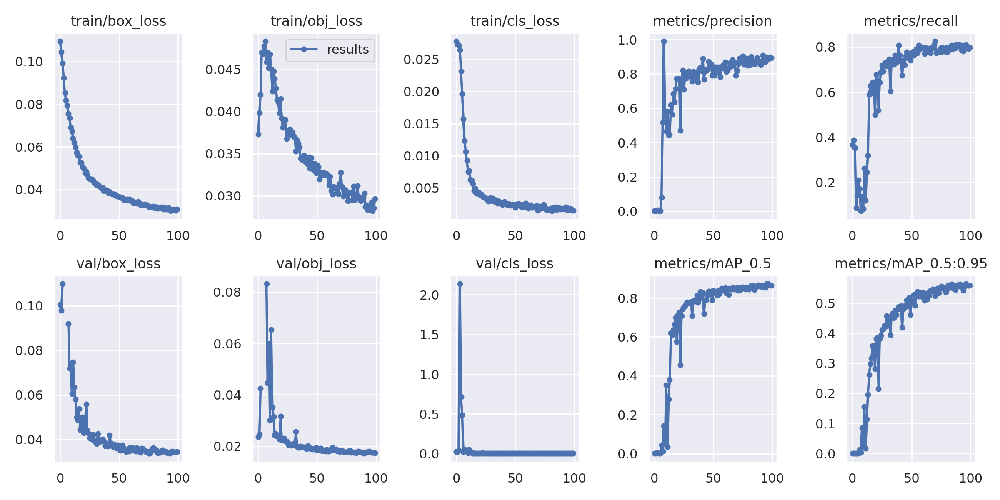

In [21]:
##### plot results.txt as results.png #####
import torch
from IPython.display import Image
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename = '/content/drive/MyDrive/PolypYolo5/yolov5/runs/train/yolov5l_results/results.png', \
      width = 1000)  # view results.png

Check the performance

GROUND TRUTH AUGMENTED TRAINING DATA:




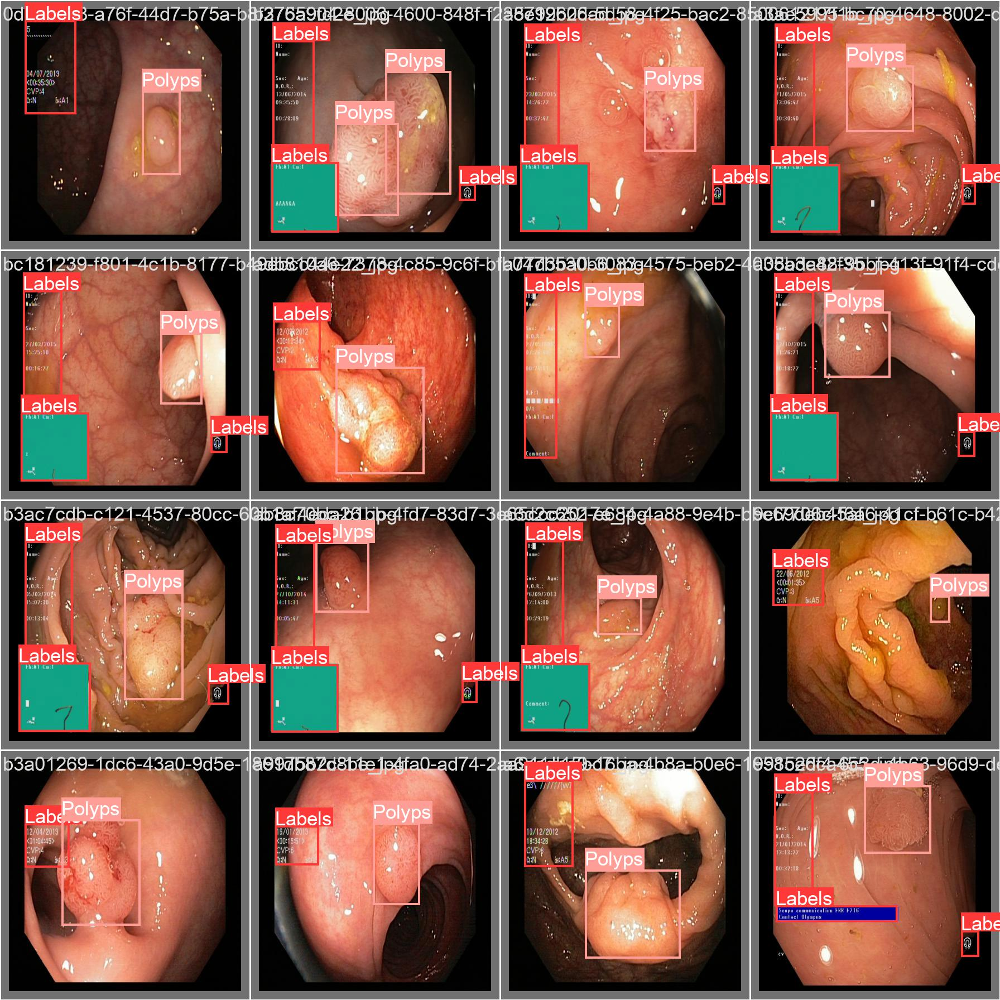

In [23]:
##### print out an augmented training example #####
print("GROUND TRUTH AUGMENTED TRAINING DATA:\n\n")
Image(filename = \
      '/content/drive/MyDrive/PolypYolo5/yolov5/runs/train/yolov5l_results/val_batch0_labels.jpg',\
      width = 800)

GROUND TRUTH AUGMENTED TRAINING DATA:




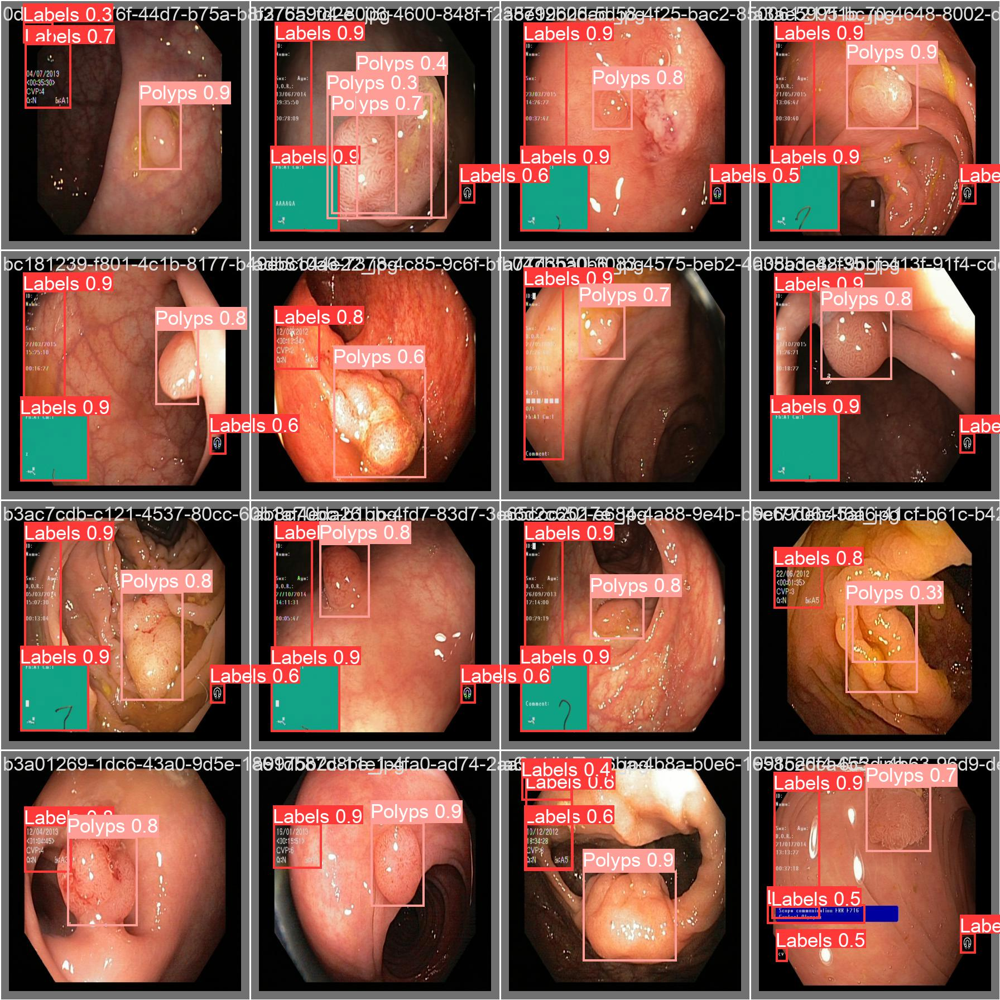

In [24]:
##### print out an augmented training example #####
print("GROUND TRUTH AUGMENTED TRAINING DATA:\n\n")
Image(filename = \
      '/content/drive/MyDrive/PolypYolo5/yolov5/runs/train/yolov5l_results/val_batch0_pred.jpg',\
      width = 800)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [25]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [26]:
%ls /content/drive/MyDrive/PolypYolo5/yolov5/runs/train/yolov5l_results/weights

best.pt  last.pt


### Predict the model for the unknown dataset

1. Here, We can pass either IMAGE or VIDEO based on our problem descriptions.

`--source /content/drive/MyDrive/yolov5setup/dataset/test/images` this is responsible for image and videos.

In [27]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/drive/MyDrive/PolypYolo5/yolov5
!python detect.py --weights runs/train/yolov5l_results/weights/best.pt\
 --img 416 --conf 0.4 --source /content/drive/MyDrive/PolypYolo5/dataset/test/images

/content/drive/MyDrive/PolypYolo5/yolov5
detect: weights=['runs/train/yolov5l_results/weights/best.pt'], source=/content/drive/MyDrive/PolypYolo5/dataset/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-102-ge4d8360 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5l summary: 267 layers, 46113663 parameters, 0 gradients, 107.7 GFLOPs
image 1/101 /content/drive/MyDrive/PolypYolo5/dataset/test/images/0d9d7b48-a76f-44d7-b75a-b8f27559fd2e_jpg.rf.119a4860171b786124022e1245939200.jpg: 416x416 1 Labels, 1 Polyps, 30.2ms
image 2/101 /content/drive/MyDrive/PolypYolo5/dataset/test/images/

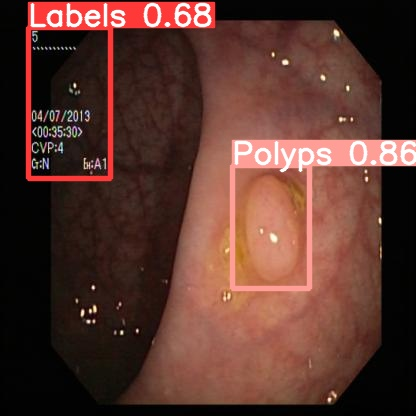

In [28]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/PolypYolo5/yolov5/runs/detect/exp/0d9d7b48-a76f-44d7-b75a-b8f27559fd2e_jpg.rf.119a4860171b786124022e1245939200.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

#### For Single Image predict 

1. all the weights have been placed in the `best.pt`. 

This is in this direction: 

**yolo5 ->runs->train->yolo_results->weights->best.pt**

Then use it with the `image` that we want to predict

In [30]:
%cd /content/drive/MyDrive/PolypYolo5/yolov5
!python detect.py --weights runs/train/yolov5l_results/weights/best.pt\
 --img 416 --conf 0.4 --source /content/drive/MyDrive/PolypYolo5/dataset/test/images/0d9d7b48-a76f-44d7-b75a-b8f27559fd2e_jpg.rf.119a4860171b786124022e1245939200.jpg

/content/drive/MyDrive/PolypYolo5/yolov5
detect: weights=['runs/train/yolov5l_results/weights/best.pt'], source=/content/drive/MyDrive/PolypYolo5/dataset/test/images/0d9d7b48-a76f-44d7-b75a-b8f27559fd2e_jpg.rf.119a4860171b786124022e1245939200.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-102-ge4d8360 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5l summary: 267 layers, 46113663 parameters, 0 gradients, 107.7 GFLOPs
image 1/1 /content/drive/MyDrive/PolypYolo5/dataset/test/images/0d9d7b48-a76f-44d7-b75a-b8f27559fd2e_jpg.rf.119a4860171b786124022e1245939200.jpg: 416x416 1 Labels, 1 Po

In [31]:
##### display inference on ALL test images #####
##### this looks much better with longer training above #####

'''
Results saved to runs/detect/exp3
'''

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/PolypYolo5/yolov5/runs/\
                            detect/exp3/0d9d7b48-a76f-44d7-b75a-b8f27559fd2e_jpg.rf.\
                            119a4860171b786124022e1245939200.jpg'): #assuming JPG
    display(Image(filename = imageName))
    print("\n")

In [29]:
%cd /content/drive/MyDrive/PolypYolo5/yolov5
!python detect.py --weights runs/train/yolov5l_results/weights/best.pt\
 --img 416 --conf 0.4 --source /content/polyp_video.mp4

/content/drive/MyDrive/PolypYolo5/yolov5
detect: weights=['runs/train/yolov5l_results/weights/best.pt'], source=/content/polyp_video.mp4, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-102-ge4d8360 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5l summary: 267 layers, 46113663 parameters, 0 gradients, 107.7 GFLOPs
video 1/1 (1/1201) /content/polyp_video.mp4: 192x416 1 Labels, 23.1ms
video 1/1 (2/1201) /content/polyp_video.mp4: 192x416 1 Labels, 19.9ms
video 1/1 (3/1201) /content/polyp_video.mp4: 192x416 1 Labels, 20.2ms
video 1/1 (4/1201) /content/polyp_video.mp4: 192x416 1 Labels, 20.1m

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive